In [64]:
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import json
%matplotlib inline
import statsmodels.discrete.discrete_model as sm
import numpy as np
import seaborn as sns
import itertools


pd.options.display.max_columns = 50
pd.options.display.max_colwidth = 300

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')
%matplotlib inline

In [2]:
data = pd.read_table('https://raw.githubusercontent.com/ga-students/DSI-CHI-1/master/lessons/week-04/3.2-logistic-regression-lab/assets/datasets/train.tsv?token=AADi65f7QdLxnVtCUFzw5jx2ZURNivs2ks5YENDqwA%3D%3D')

In [3]:
data['title'] = data.boilerplate.map(lambda x: json.loads(x).get('title', ''))
data['body'] = data.boilerplate.map(lambda x: json.loads(x).get('body', ''))

In [7]:
data = pd.get_dummies(data[(data.alchemy_category != '?')], columns=['alchemy_category'])

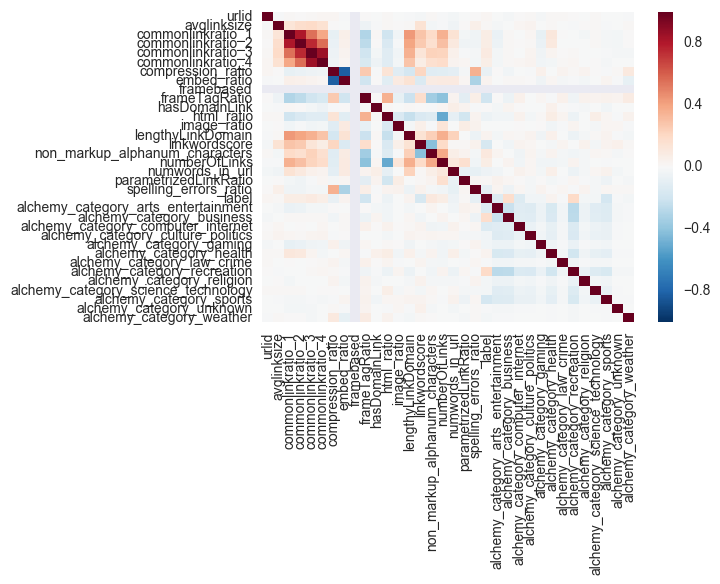

In [9]:
sns.heatmap(data.corr())

In [10]:
np.abs(data.corr()['label']).sort_values()

hasDomainLink                          0.003550
image_ratio                            0.004524
avglinksize                            0.012569
alchemy_category_unknown               0.012778
parametrizedLinkRatio                  0.013933
alchemy_category_law_crime             0.015590
urlid                                  0.018960
alchemy_category_religion              0.024504
alchemy_category_weather               0.029208
alchemy_category_science_technology    0.030442
lengthyLinkDomain                      0.032586
alchemy_category_culture_politics      0.032825
alchemy_category_health                0.036465
alchemy_category_gaming                0.037118
embed_ratio                            0.037649
numwords_in_url                        0.049788
html_ratio                             0.056637
commonlinkratio_4                      0.064703
commonlinkratio_1                      0.071685
compression_ratio                      0.072666
commonlinkratio_2                      0

In [11]:
names = ['non_markup_alphanum_characters', 'alchemy_category_computer_internet', 
         'alchemy_category_arts_entertainment', 'linkwordscore', 'alchemy_category_business',
         'alchemy_category_sports', 'alchemy_category_recreation', 'frameTagRatio'
        ]

In [66]:
names = ['hasDomainLink',
'image_ratio',
'avglinksize',
'alchemy_category_unknown',
'parametrizedLinkRatio',
'alchemy_category_law_crime',
'alchemy_category_religion',
'alchemy_category_weather',
'alchemy_category_science_technology',
'lengthyLinkDomain',
'alchemy_category_culture_politics',
'alchemy_category_health',
'alchemy_category_gaming',
'embed_ratio',
'numwords_in_url',
'html_ratio',
'commonlinkratio_4',
'commonlinkratio_1',
'compression_ratio',
'commonlinkratio_2',
'numberOfLinks',
'commonlinkratio_3',
'spelling_errors_ratio',
'non_markup_alphanum_characters',
'alchemy_category_computer_internet',
'alchemy_category_arts_entertainment',
'linkwordscore',
'alchemy_category_business',
'alchemy_category_sports',
'alchemy_category_recreation',
'frameTagRatio']

In [ ]:
for L in range(0, len(names)+1):
    for subset in itertools.permutations(names, L):
        print(list(subset))

[]
['hasDomainLink']
['image_ratio']
['avglinksize']
['alchemy_category_unknown']
['parametrizedLinkRatio']
['alchemy_category_law_crime']
['alchemy_category_religion']
['alchemy_category_weather']
['alchemy_category_science_technology']
['lengthyLinkDomain']
['alchemy_category_culture_politics']
['alchemy_category_health']
['alchemy_category_gaming']
['embed_ratio']
['numwords_in_url']
['html_ratio']
['commonlinkratio_4']
['commonlinkratio_1']
['compression_ratio']
['commonlinkratio_2']
['numberOfLinks']
['commonlinkratio_3']
['spelling_errors_ratio']
['non_markup_alphanum_characters']
['alchemy_category_computer_internet']
['alchemy_category_arts_entertainment']
['linkwordscore']
['alchemy_category_business']
['alchemy_category_sports']
['alchemy_category_recreation']
['frameTagRatio']
['hasDomainLink', 'image_ratio']
['hasDomainLink', 'avglinksize']
['hasDomainLink', 'alchemy_category_unknown']
['hasDomainLink', 'parametrizedLinkRatio']
['hasDomainLink', 'alchemy_category_law_crime'

In [18]:
X = data[names]
y = data.label
logit = LogisticRegression()

<bound method LogisticRegression.score of LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)>

In [19]:
model = logit.fit(X, y)
model.score(X, y)

0.6621808826439739

In [21]:
print np.array(y)
print np.array(X)

[0 1 1 ..., 0 1 1]
[[  5.42400000e+03   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   9.07738100e-02]
 [  4.97300000e+03   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    1.00000000e+00   9.87074030e-02]
 [  2.24000000e+03   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   7.24478590e-02]
 ..., 
 [  5.67200000e+03   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   5.73770490e-02]
 [  8.48000000e+02   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    1.00000000e+00   1.24121780e-01]
 [  3.86000000e+02   0.00000000e+00   1.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   9.77777780e-02]]


In [23]:
# X.linkwordscore

In [26]:
print y.shape, X.shape

(5053,) (5053, 8)


In [34]:
y_pred = model.predict(X)
y_pred

array([1, 1, 0, ..., 0, 1, 0])

In [35]:
confusion_matrix(y, y_pred)

array([[1457,  976],
       [ 731, 1889]])

In [58]:
con_mat = np.array(confusion_matrix(y, y_pred))

In [59]:
confusion = pd.DataFrame(con_mat, index=['not_green', 'is_green'],
                         columns=['predicted_green', 'predicted_not_green'])

In [60]:
confusion

,predicted_green,predicted_not_green
not_green,1457,976
is_green,731,1889


In [62]:
model.predict_proba?

In [42]:
Y_pp = pd.DataFrame(model.predict_proba(X), columns=['class_0_pp','class_1_pp'])
print(Y_pp.iloc[0:10])

   class_0_pp  class_1_pp
0    0.279000    0.721000
1    0.363321    0.636679
2    0.601697    0.398303
3    0.494187    0.505813
4    0.732098    0.267902
5    0.620434    0.379566
6    0.366823    0.633177
7    0.846097    0.153903
8    0.638127    0.361873
9    0.353489    0.646511


In [45]:
Y_pp['pred_class_thresh50'] = y_pred
print(Y_pp.iloc[0:10])

   class_0_pp  class_1_pp  pred_class_thresh50
0    0.279000    0.721000                    1
1    0.363321    0.636679                    1
2    0.601697    0.398303                    0
3    0.494187    0.505813                    1
4    0.732098    0.267902                    0
5    0.620434    0.379566                    0
6    0.366823    0.633177                    1
7    0.846097    0.153903                    0
8    0.638127    0.361873                    0
9    0.353489    0.646511                    1


In [47]:
conmat = np.array(confusion_matrix(y, y_pred, labels=[1,0]))
confusion = pd.DataFrame(conmat, index=['not_green', 'is_green'],
                         columns=['predicted_green', 'predicted_not_green'])
print(confusion)

           predicted_green  predicted_not_green
not_green             1889                  731
is_green               976                 1457


In [48]:
Y_pp['pred_class_thresh10'] = [1 if x >= 0.10 else 0 for x in Y_pp.class_1_pp.values]
print(Y_pp.iloc[0:10])

   class_0_pp  class_1_pp  pred_class_thresh50  pred_class_thresh10
0    0.279000    0.721000                    1                    1
1    0.363321    0.636679                    1                    1
2    0.601697    0.398303                    0                    1
3    0.494187    0.505813                    1                    1
4    0.732098    0.267902                    0                    1
5    0.620434    0.379566                    0                    1
6    0.366823    0.633177                    1                    1
7    0.846097    0.153903                    0                    1
8    0.638127    0.361873                    0                    1
9    0.353489    0.646511                    1                    1


In [49]:
conmat_10 = np.array(confusion_matrix(y, Y_pp.pred_class_thresh10.values, labels=[1,0]))

confusion_10 = pd.DataFrame(conmat_10, index=['not_green', 'is_green'],
                         columns=['predicted_green', 'predicted_not_green'])

print(confusion_10)

           predicted_green  predicted_not_green
not_green             2616                    4
is_green              2420                   13


In [55]:
Y_score = model.decision_function(X)

FPR = {}
TPR = {}
ROC_AUC = {}
print roc_curve(y, Y_score)

(array([  0.00000000e+00,   4.11015208e-04,   4.11015208e-04, ...,
         9.97944924e-01,   1.00000000e+00,   1.00000000e+00]), array([  3.81679389e-04,   3.81679389e-04,   5.72519084e-03, ...,
         9.99618321e-01,   9.99618321e-01,   1.00000000e+00]), array([ 2.46831561,  2.4556326 ,  1.71692428, ..., -2.31507597,
       -2.45533126, -2.4699018 ]))


In [56]:
FPR[1], TPR[1], _ = roc_curve(y, Y_score)
ROC_AUC[1] = auc(FPR[1], TPR[1])

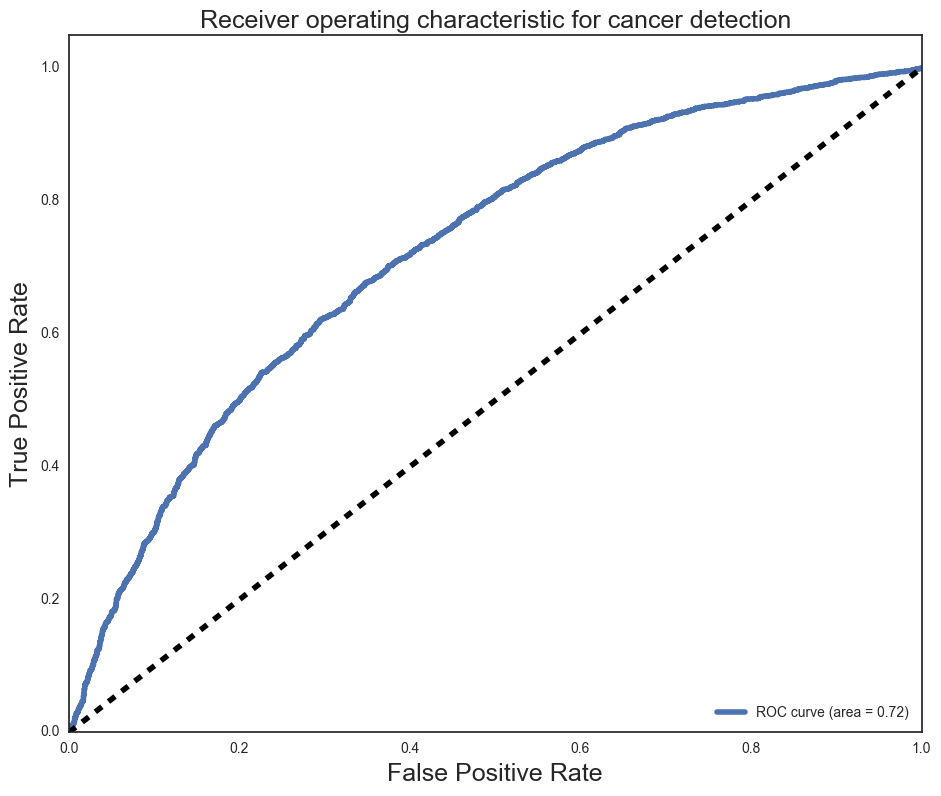

In [57]:
plt.figure(figsize=[11,9])
plt.plot(FPR[1], TPR[1], label='ROC curve (area = %0.2f)' % ROC_AUC[1], linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=18)
plt.ylabel('True Positive Rate', fontsize=18)
plt.title('Receiver operating characteristic for cancer detection', fontsize=18)
plt.legend(loc="lower right")
plt.show()